# Using the Grid lines

In [1]:
import numpy as np
import pyfits
import matplotlib.pyplot as plt
import skimage
from skimage.feature import blob_dog, blob_doh, blob_log, canny
from skimage.color import rgb2gray
from skimage.feature import corner_harris, corner_subpix, corner_peaks
from skimage.segmentation import slic
from skimage.filter import sobel
from scipy.signal import convolve2d
from scipy.ndimage import gaussian_filter
from skimage import measure
from scipy.optimize import curve_fit
import matplotlib.ticker as mtick


/usr/local/lib/python2.7/dist-packages/skimage/filter/__init__.py:6: skimage_deprecation: The `skimage.filter` module has been renamed to `skimage.filters`.  This placeholder module will be removed in v0.13.
  warn(skimage_deprecation('The `skimage.filter` module has been renamed '


In [2]:
path = '/home/fatima/Desktop/solar_orbiter_project/codes/targets/'
grid = pyfits.getdata(path+'calibration_lines.fits')
grid = rgb2gray(grid)

#grid = grid[135:1759,168:1792] #trim the edges


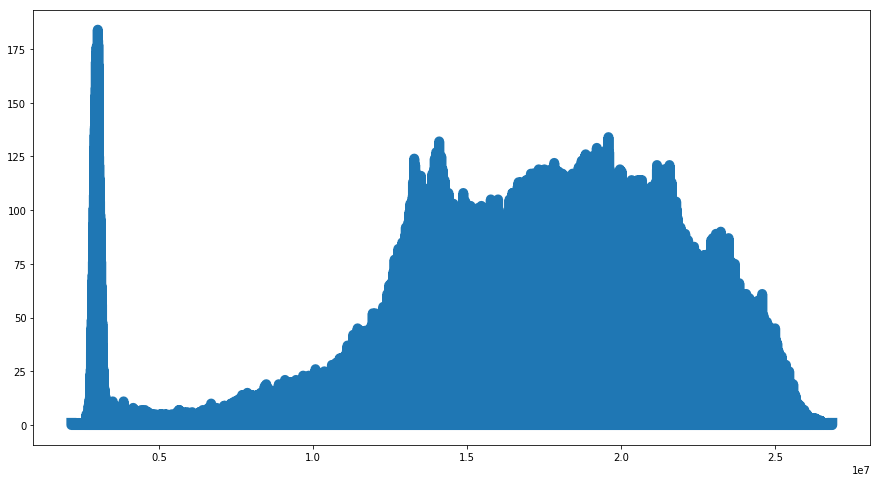

In [102]:
from skimage.exposure import histogram
hist, hist_centers = histogram(grid)
fig, ax = plt.subplots(figsize=(15, 8))
ax.plot(hist_centers, hist, lw=10)

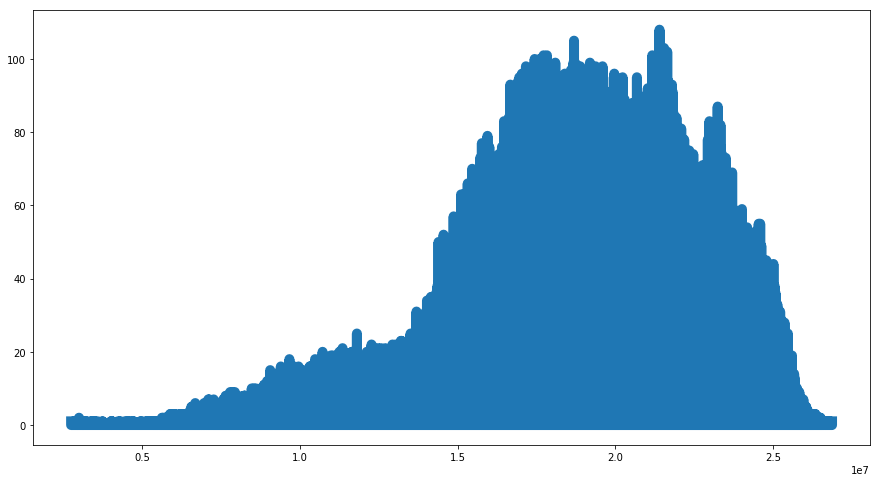

In [103]:
from skimage.exposure import histogram
hist, hist_centers = histogram(grid[135:1759,168:1792])
fig, ax = plt.subplots(figsize=(15, 8))
ax.plot(hist_centers, hist, lw=10)

In [122]:
grid2 = grid[135:1759,168:1792] #trim the edges
mask = np.zeros(grid2.shape)
mask[grid2<1.4e07] = 0
mask[grid2>1.4e07] = 1


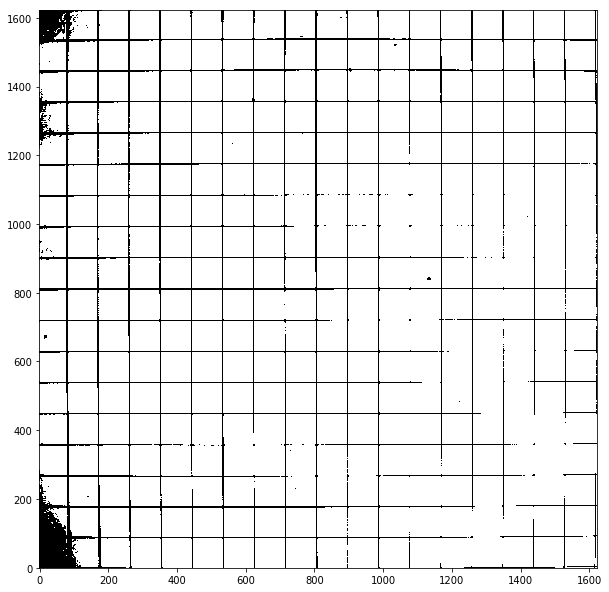

In [123]:
fig = plt.figure(figsize=(10,15))
fig.add_subplot(111)
plt.imshow(mask, cmap='gray', origin='bottom')


# Detect corners

In [3]:
#edges = canny(grid,sigma=3)
edges = sobel(grid)

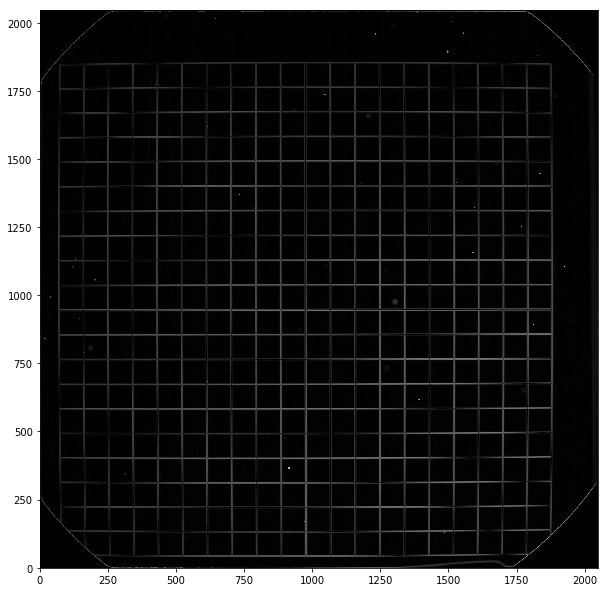

In [268]:
fig = plt.figure(figsize=(10,15))
fig.add_subplot(111)
plt.imshow(edges, cmap='gray', origin='bottom')


In [269]:
type(edges)
np.where(edges==False)
z = edges.astype(int)
print np.where(z==0)
hdu = pyfits.PrimaryHDU(z)
hdu.header['TIME'] = 'today'
#>hdu.writeto('z.fits')

(array([   0,    0,    0, ..., 2047, 2047, 2047]), array([   0,    1,    2, ..., 2045, 2046, 2047]))


In [4]:
edges = edges/edges.mean()

In [271]:
edges

array([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.16279618,  0.0484833 , ...,  0.02974744,
         0.08617507,  0.        ],
       [ 0.        ,  0.15582354,  0.04107998, ...,  0.01000248,
         0.07562251,  0.        ],
       ..., 
       [ 0.        ,  0.14097174,  0.03610829, ...,  0.00846555,
         0.06774031,  0.        ],
       [ 0.        ,  0.14746044,  0.05846743, ...,  0.01910139,
         0.07293257,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ]])

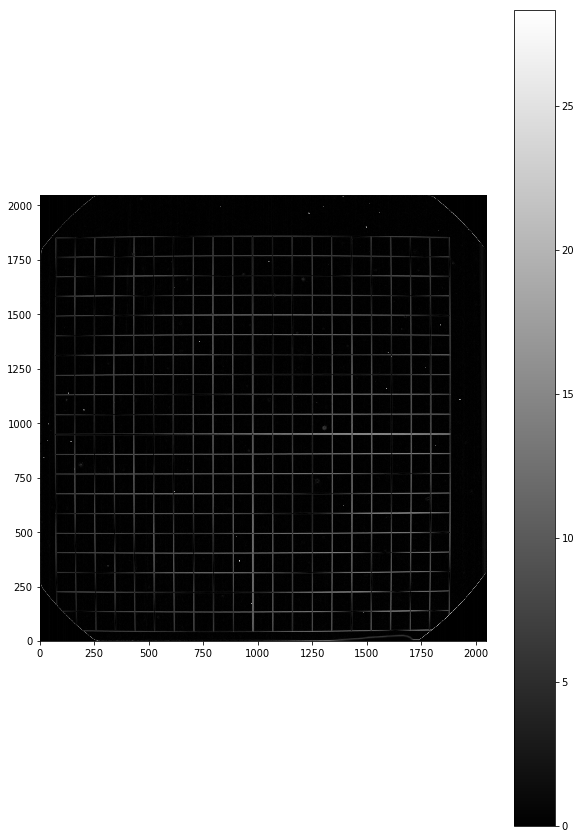

In [272]:
fig = plt.figure(figsize=(10,15))
fig.add_subplot(111)
plt.imshow(edges, cmap='gray', origin='bottom')
plt.colorbar()


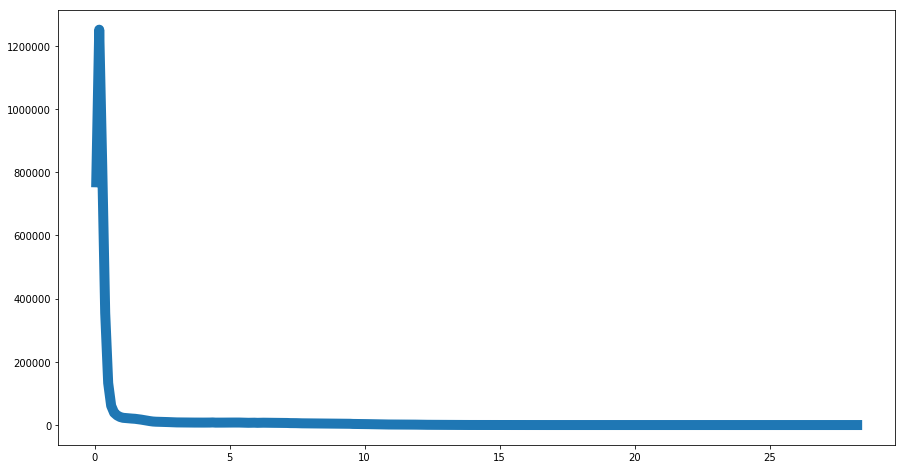

In [273]:
hist, hist_centers = histogram(edges)
fig, ax = plt.subplots(figsize=(15, 8))
ax.plot(hist_centers, hist, lw=10)

In [5]:
mask = np.zeros((grid.shape[1],grid.shape[0]))
mask[edges>3] = 1
mask[edges<3] = 0


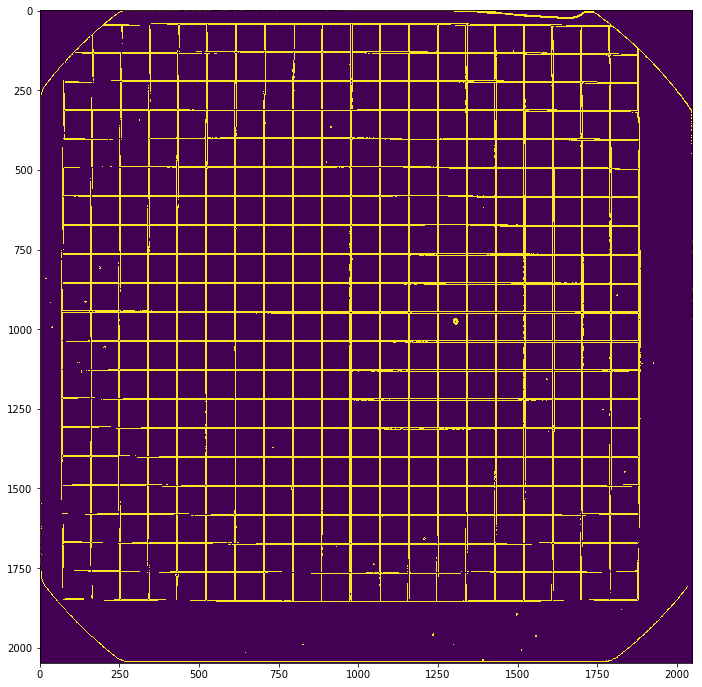

In [6]:
fig=plt.figure(figsize=(25,12))
plt.imshow(mask)



In [303]:
fill = ndi.binary_fill_holes(mask)

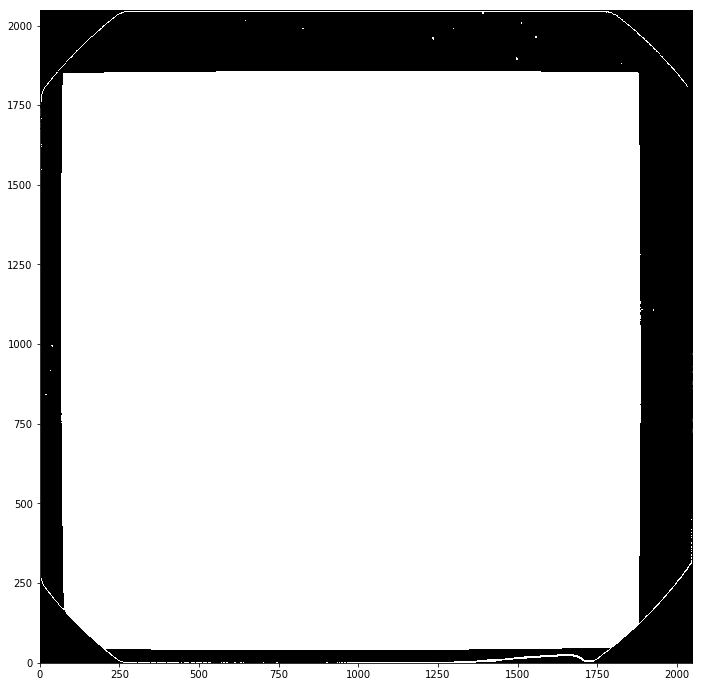

In [306]:
fig = plt.figure(figsize=(18,12))
plt.imshow(fill,cmap='gray',origin='lower')


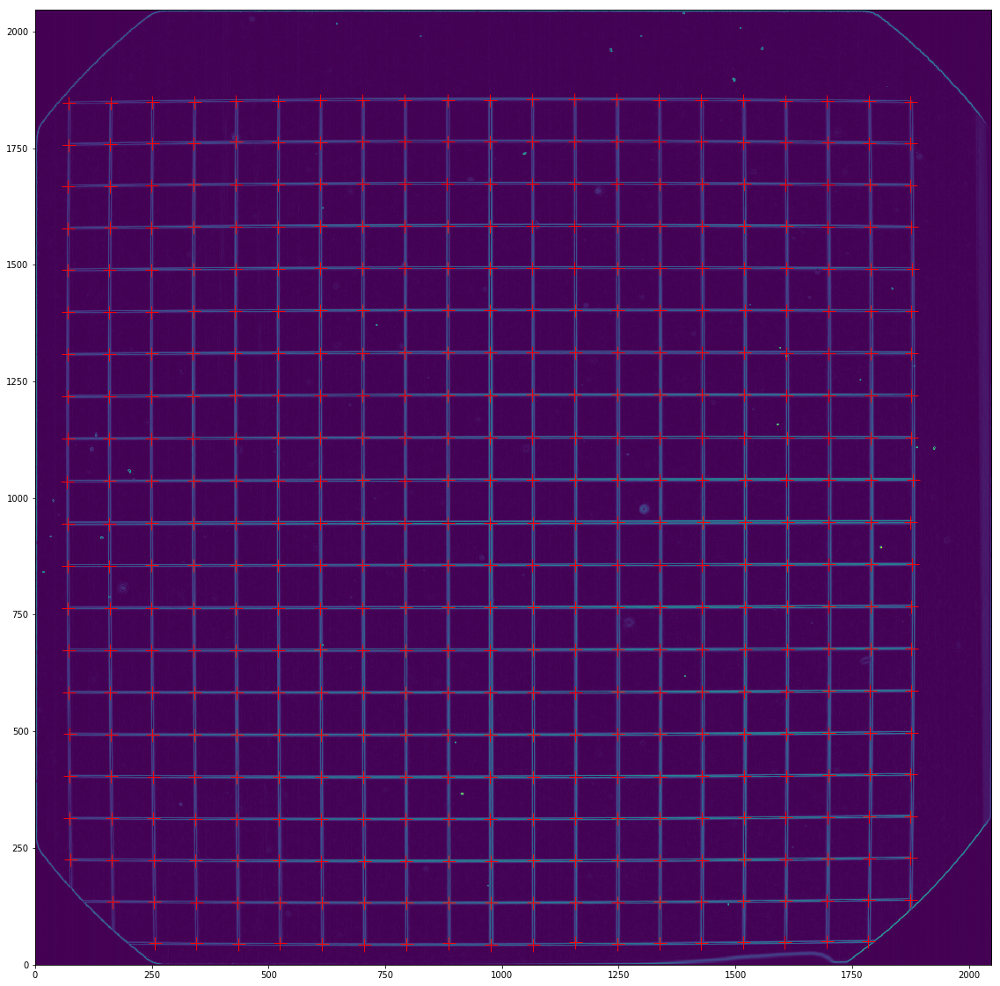

In [7]:
response = corner_harris(mask, k=0.1,sigma=20)
coords = corner_peaks(response, num_peaks=3000)
coords_subpix = corner_subpix(mask, coords, window_size=30, alpha=0.9)


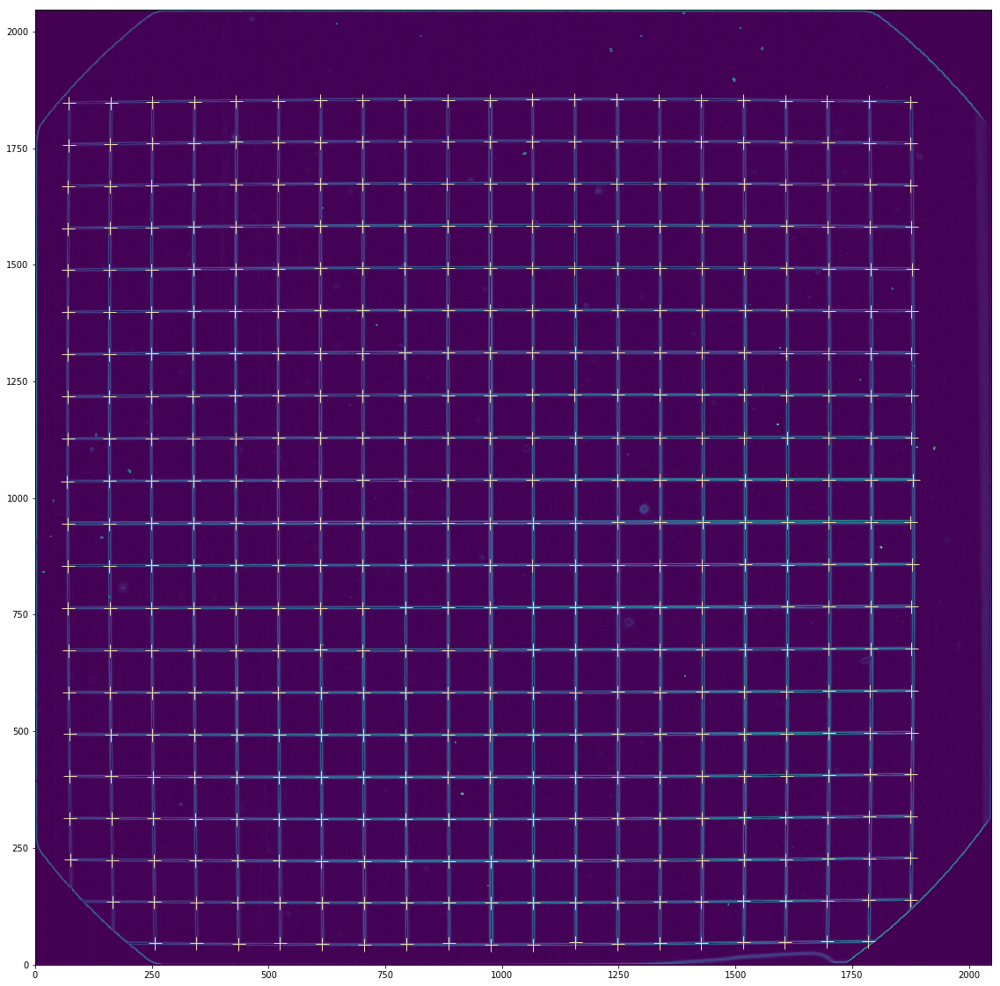

In [13]:

figure = plt.figure(figsize=(20,20))
ax = figure.add_subplot(111)
ax.imshow(edges, origin='bottom')
#ax.plot(coords[:,1], coords[:,0],color='cyan', marker='o',linestyle='None', markersize=6)
ax.plot(coords_subpix[:, 1], coords_subpix[:, 0], '+',color='wheat', markersize=15)

plt.savefig('grid_coords.png',dpi=300)

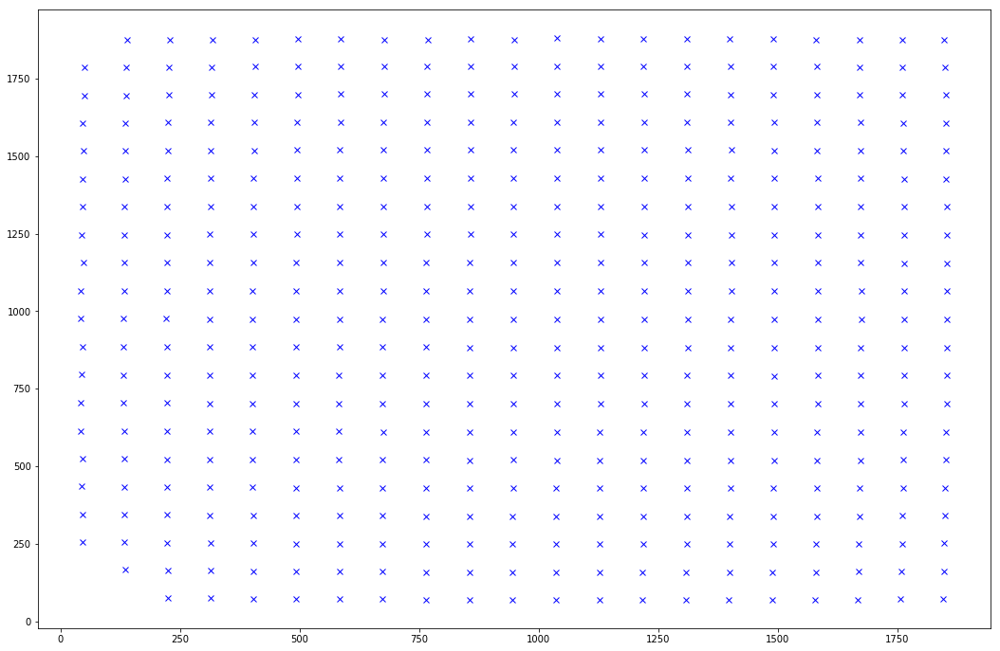

In [16]:
y = coords[:,0]
x = coords[:,1]
x_sub = coords_subpix[:,0]
y_sub = coords_subpix[:,1]
fig = plt.figure(figsize=(18,12))
ax1 = fig.add_subplot(111)
#ax2 = fig.add_subplot(122)
#ax1.plot(x,y,'rx')
ax1.plot(x_sub, y_sub,'bx')
#plt.show()
plt.savefig('grid_coords_2.png',dpi=300)

# to label the squares instead

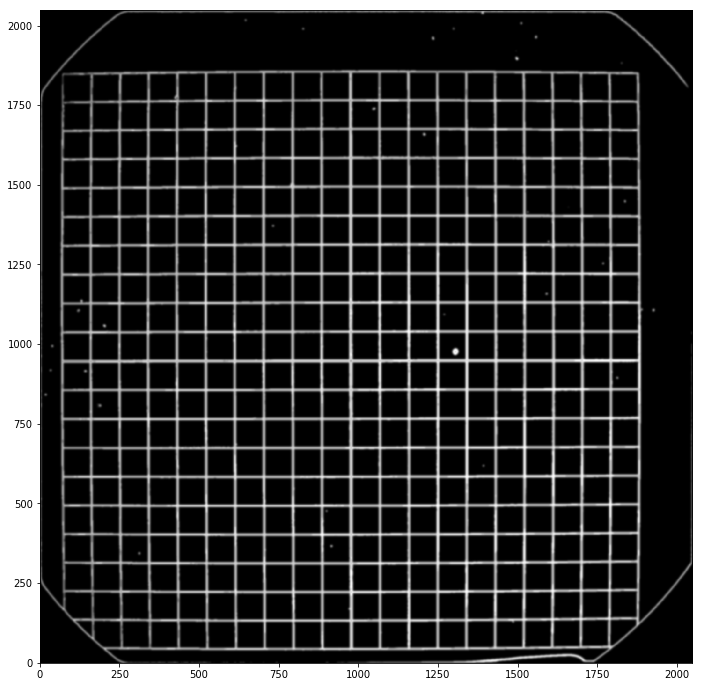

In [307]:
from scipy.ndimage.filters import gaussian_filter as gf
mask_smooth = gf(mask,sigma=3,mode='nearest')
mask_smooth.max()
fig = plt.figure(figsize=(18,12))
plt.imshow(mask_smooth,cmap='gray',origin='lower')


In [308]:
mask_2 = np.zeros((2048,2048))
mask_2[mask_smooth>0.2] = 0
mask_2[mask_smooth<0.2] =1

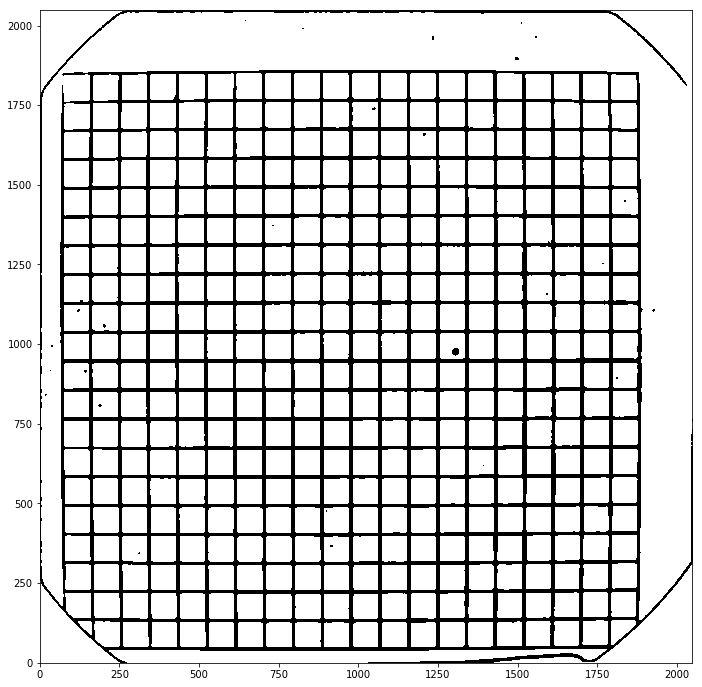

In [309]:
fig = plt.figure(figsize=(18,12))
plt.imshow(mask_2,cmap='gray',origin='lower')


In [310]:
from scipy import ndimage as ndi
fill = ndi.binary_fill_holes(mask_2)

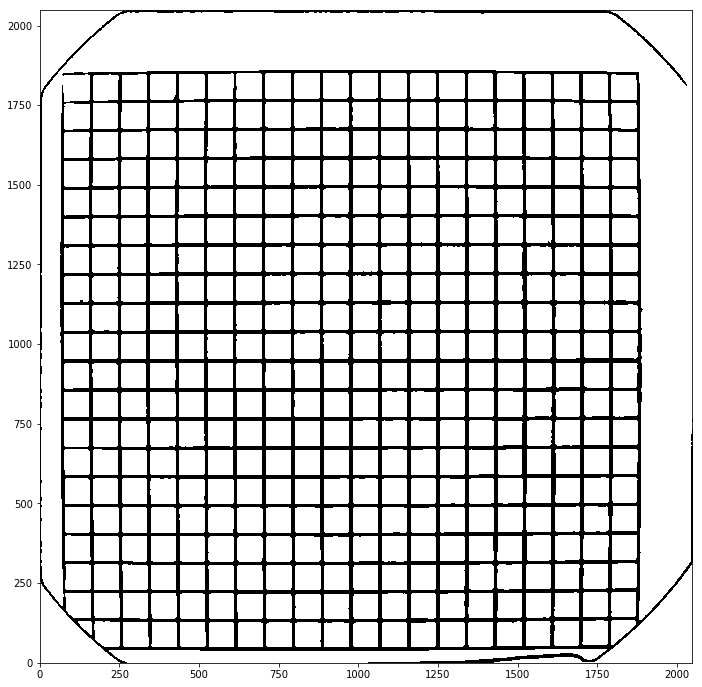

In [311]:
fig = plt.figure(figsize=(18,12))
plt.imshow(fill,cmap='gray',origin='lower')


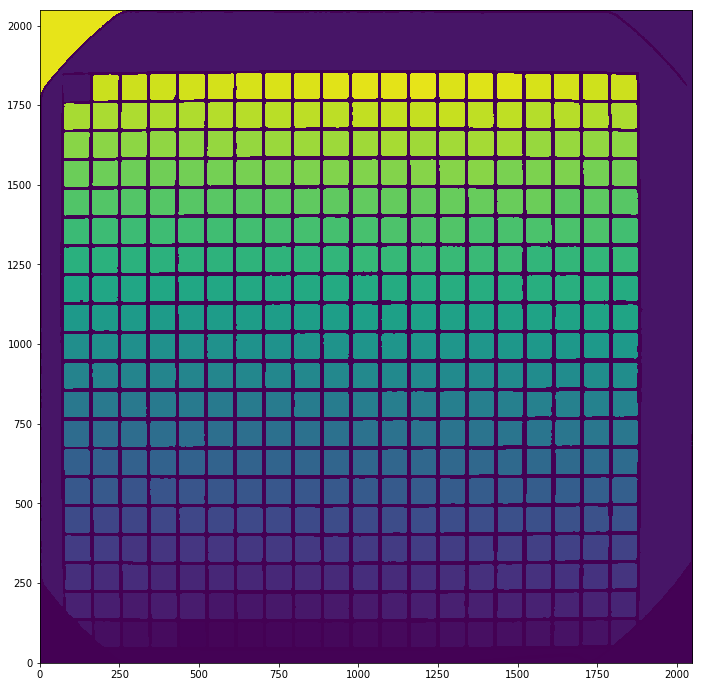

In [312]:
labels, numb = measure.label(fill,background=0, return_num=True)
fig = plt.figure(figsize=(18,12))

plt.imshow(labels, origin='lower')


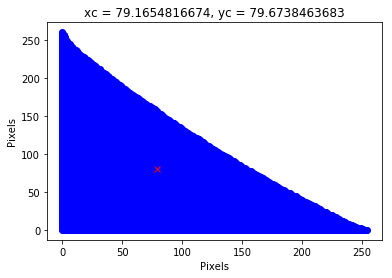

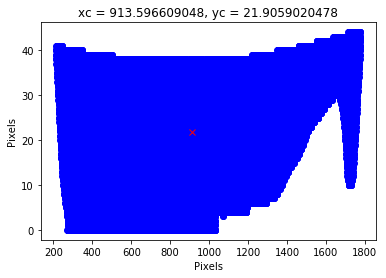

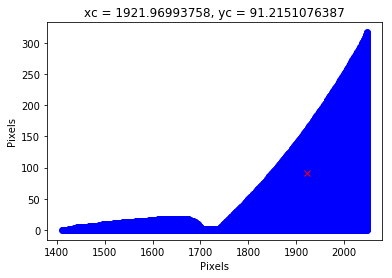

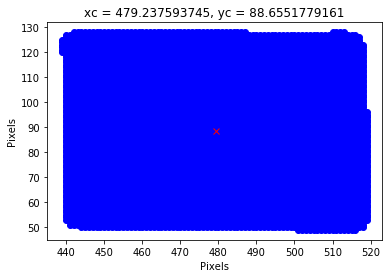

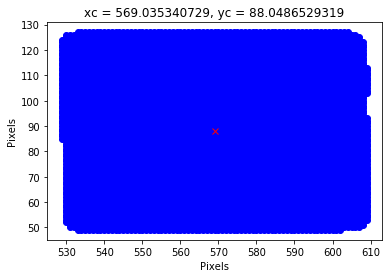

...

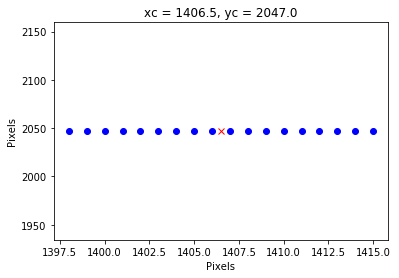

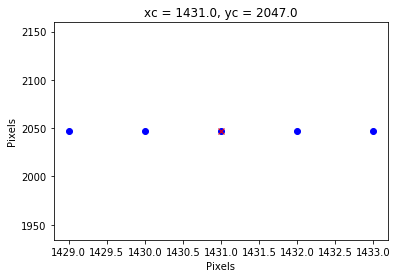

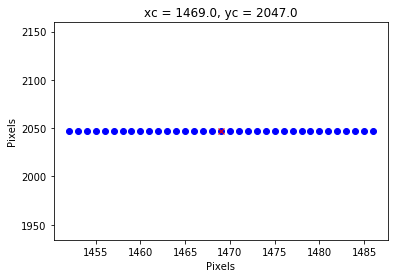

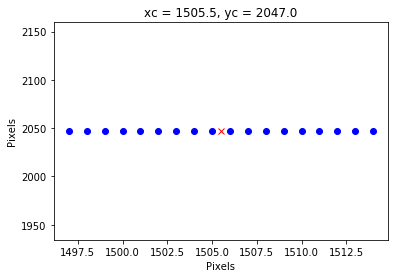

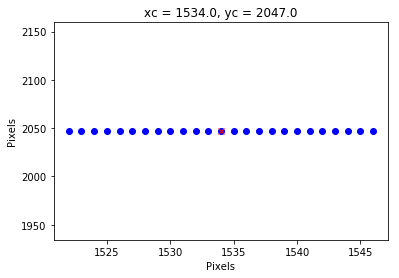

In [314]:
props = skimage.measure.regionprops(labels)

for i in np.arange(numb):
    y, x = props[i].coords[:,0], props[i].coords[:,1]
    yc, xc = props[i].centroid
    plt.plot(x,y,'bo')
    plt.plot(xc,yc,'rx')
    #plt.title('Feature# '+str(label),fontsize=22)
    plt.xlabel('Pixels')
    plt.ylabel('Pixels')
    plt.title('xc = '+str(xc)+', yc = '+str(yc))
    plt.show()
#plt.show()

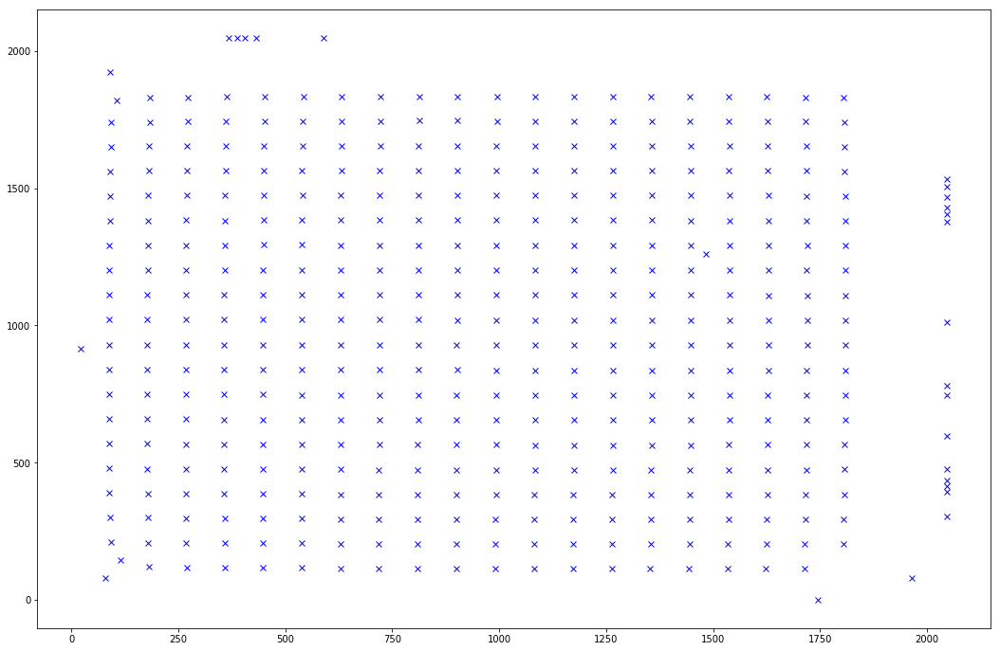

In [322]:
centers = np.array([prop.centroid for prop in props])

fig = plt.figure(figsize=(18,12))
ax1 = fig.add_subplot(111)
#ax2 = fig.add_subplot(122)
#ax1.plot(x,y,'rx')
ax1.plot(centers[:,0], centers[:,1],'bx')
plt.show()

# testing edge detection matrices myself

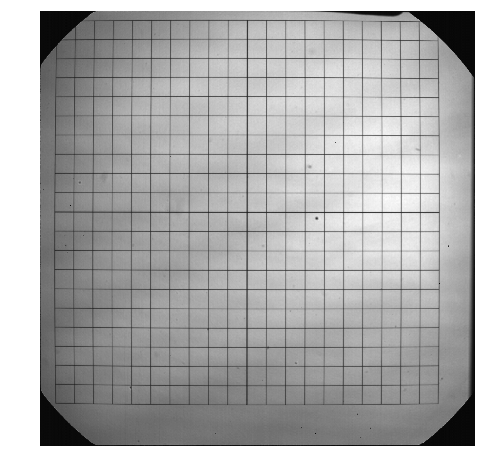

In [234]:
#seg = slic(points, n_segments=50,compactness=30, sigma=10)
fig = plt.figure(figsize=(12,8))
kernerl = np.array([
    [0,0,0],
    [0,1,0],
    [0,0,0]
])
temp = convolve2d(grid,kernerl,mode='same')
plt.axis('off')
plt.imshow(temp,cmap='gray')
plt.show()


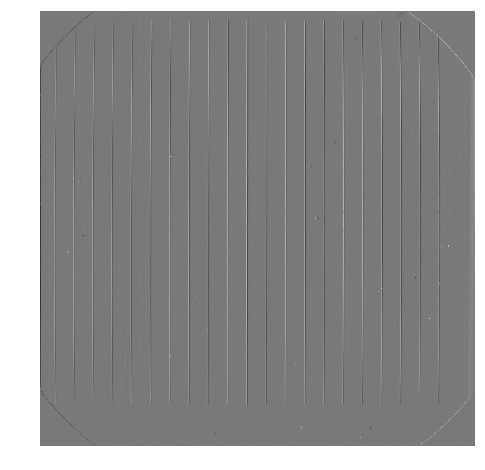

In [263]:
fig = plt.figure(figsize=(12,8))
kernerl = np.array([
    [-1,0,1],
    [-1,0,1],
    [-1,0,1]
])

temp = convolve2d(grid,kernerl,mode='same')
plt.axis('off')
plt.imshow(temp,cmap='gray')
plt.show()


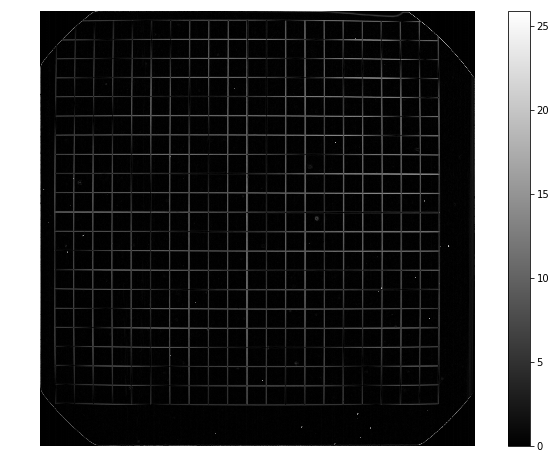

In [239]:
kernerl1 = np.array([
    [-1,-1,-1],
    [0,0,0],
    [1,1,1]
])
kernerl2 = np.array([
    [-1,0,1],
    [-1,0,1],
    [-1,0,1]
])
temp1 = convolve2d(grid,kernerl1,mode='same')
temp2 = convolve2d(grid,kernerl2,mode='same')
    
temp3 = np.sqrt(temp1**2 + temp2**2)
temp3 = temp3/temp3.mean()

fig = plt.figure(figsize=(12,8))
plt.axis('off')
plt.imshow(temp3,cmap='gray')
plt.colorbar()
plt.show()



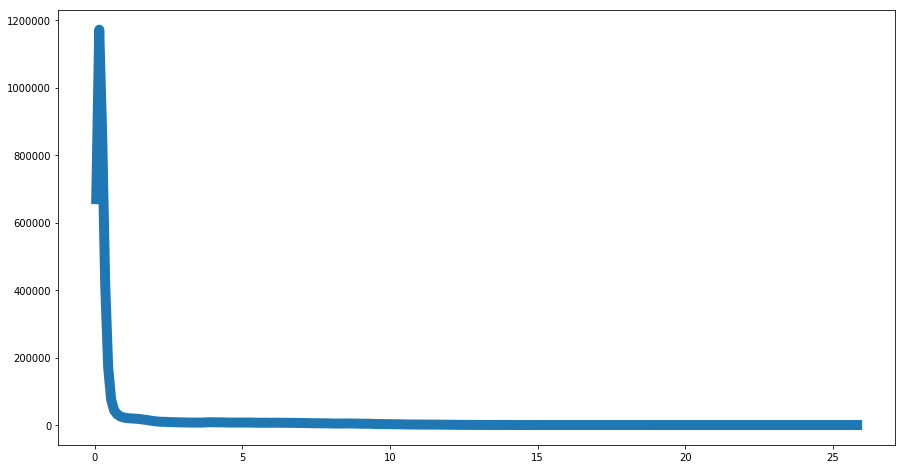

In [216]:
hist, hist_centers = histogram(temp3)
fig, ax = plt.subplots(figsize=(15, 8))
ax.plot(hist_centers, hist, lw=10)

In [229]:
mask = np.zeros((grid.shape[1],grid.shape[0]))
mask[temp3>3] = 1
mask[temp3<3] = 0

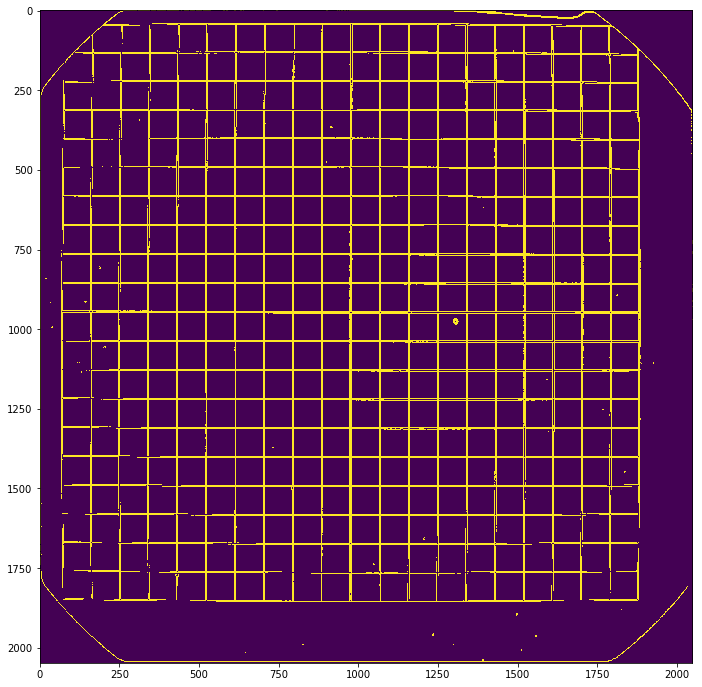

In [230]:
fig=plt.figure(figsize=(25,12))
plt.imshow(mask)


/usr/local/lib/python2.7/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: divide by zero encountered in divide
  from ipykernel import kernelapp as app


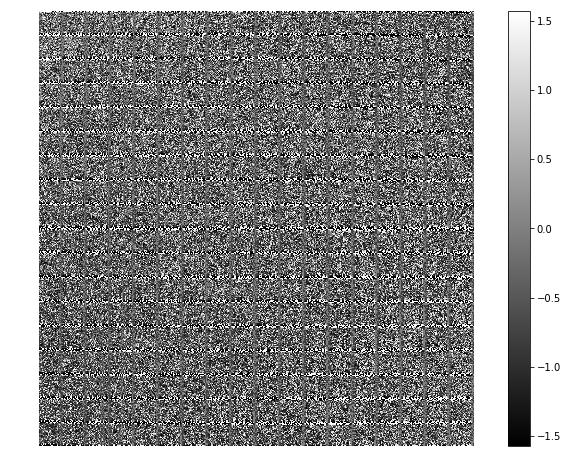

array([[ -7820288, -12310016, -13273600, ..., -45350144, -47196672,
        -31835648],
       [ -5828096,  -9199104,  -9939200, ...,  10134272,  10475264,
          6972928],
       [ -7093504, -10882560, -11440384, ...,  22043648,  22806784,
         15278848],
       ..., 
       [  4286464,   6438400,   6530048, ...,   1150208,   1349120,
           981504],
       [  6502144,   9763584,   9886464, ...,   2094592,   2675712,
          1995264],
       [ 13118464,  19879168,  20137472, ...,  31526912,  35317760,
         24442880]])

In [461]:
kernerl1 = np.array([
    [-1,-1,-1],
    [0,0,0],
    [1,1,1]
])
kernerl2 = np.array([
    [-1,0,1],
    [-1,0,1],
    [-1,0,1]
])

temp1 = convolve2d(points,kernerl1,mode='same')
temp2 = convolve2d(points,kernerl2,mode='same')
    
temp3 = np.arctan(temp1/temp2)
fig = plt.figure(figsize=(12,8))
plt.axis('off')
plt.imshow(temp3,cmap='gray')
plt.colorbar()
plt.show()
temp1


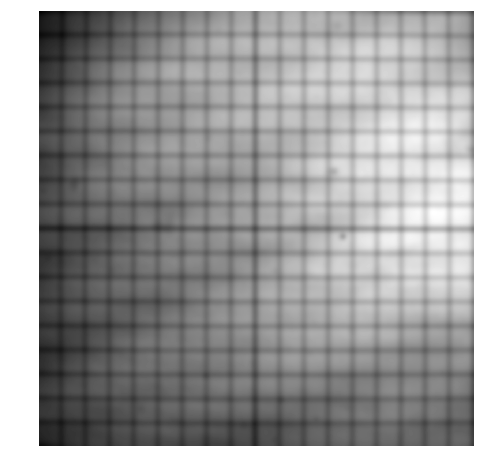

In [462]:
fig = plt.figure(figsize=(12,8))

temp = gaussian_filter(points, sigma = 10)
plt.axis('off')
plt.imshow(temp,cmap='gray')
plt.show()


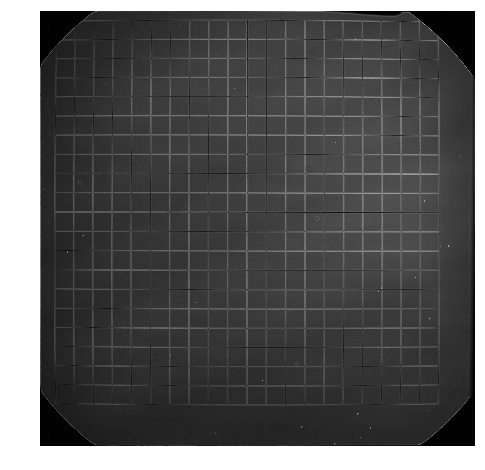

In [244]:
kernerl1 = np.array([
    [1,1,1],
    [0,0,0],
    [-1,-1,-1]
])
kernerl2 = np.array([
    [1,0,-1],
    [1,0,-1],
    [1,0,-1]
])
fig = plt.figure(figsize=(12,8))
temp1 = convolve2d(grid,kernerl1,mode='same')
temp2 = convolve2d(grid,kernerl2,mode='same')
    
temp3 = np.sqrt(temp1**2 + temp2**2) + grid

plt.axis('off')
plt.imshow(temp3,cmap='gray')
plt.show()


